# R_FCN

![alternative text](/Users/ostapbodnar/Desktop/rfcn.png)

In [9]:
!pip install openvino-dev[pytorch,tensorflow2]==2022.3.0

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 578.1/578.1 MB 2.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 511.8/511.8 MB 2.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 438.7/438.7 kB 29.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.6/42.6 kB 4.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 44.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 58.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.8/5.8 MB 60.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 72.2 MB/s eta 0:00:00
  Attempting uninstall: keras
    Found existing installation: Keras 2.0.8
    Uninstalling Keras-2.0.8:
      Successfully uninstalled Keras-2.0.8
  Attempting uninstall: flatbuffers
    Found existing installation: flatbuffers 23.3.3
    Uninstalling flatbuffe

In [10]:
!omz_downloader --name rfcn-resnet101-coco-tf

################|| Downloading rfcn-resnet101-coco-tf ||################

========== Downloading /content/public/rfcn-resnet101-coco-tf/rfcn_resnet101_coco_2018_01_28.tar.gz
... 100%, 637651 KB, 31337 KB/s, 20 seconds passed

========== Unpacking /content/public/rfcn-resnet101-coco-tf/rfcn_resnet101_coco_2018_01_28.tar.gz



In [11]:
!omz_converter --name rfcn-resnet101-coco-tf

========== Converting rfcn-resnet101-coco-tf to IR (FP16)
Conversion command: /usr/bin/python3 -- /usr/local/bin/mo --framework=tf --data_type=FP16 --output_dir=/content/public/rfcn-resnet101-coco-tf/FP16 --model_name=rfcn-resnet101-coco-tf --input=image_tensor --reverse_input_channels --output=detection_scores,detection_boxes,num_detections --transformations_config=/usr/local/lib/python3.9/dist-packages/openvino/tools/mo/front/tf/rfcn_support.json --tensorflow_object_detection_api_pipeline_config=/content/public/rfcn-resnet101-coco-tf/rfcn_resnet101_coco_2018_01_28/pipeline.config --input_model=/content/public/rfcn-resnet101-coco-tf/rfcn_resnet101_coco_2018_01_28/frozen_inference_graph.pb '--layout=image_tensor(NHWC)' '--input_shape=[1, 600, 600, 3]'

[ WARNING ]  Use of deprecated cli option --data_type detected. Option use in the following releases will be fatal. 
[ WARNING ]  Model Optimizer removes pre-processing block of the model which resizes image keeping aspect ratio. Inferen

In [125]:
import cv2
import numpy as np
from openvino.inference_engine import IECore

# Load the OpenVINO inference engine
ie = IECore()

# Load the rfcn-resnet101-coco-tf model
model_xml = '/content/public/rfcn-resnet101-coco-tf/FP32/rfcn-resnet101-coco-tf.xml'
model_bin = '/content/public/rfcn-resnet101-coco-tf/FP32/rfcn-resnet101-coco-tf.bin'
net = ie.read_network(model=model_xml, weights=model_bin)

In [187]:
classes = ["bg", 'person', 'bicycle', 'car', 'motorbike', 'aeroplane', 'bus', 'train', 'truck', 'boat', 'trafficlight', 'firehydrant', 'streetsign', 'stopsign', 'parkingmeter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'hat', 'backpack', 'umbrella', 'shoe', 'eyeglasses', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sportsball', 'kite', 'baseballbat', 'baseballglove', 'skateboard', 'surfboard', 'tennisracket', 'bottle', 'plate', 'wineglass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hotdog', 'pizza', 'donut', 'cake', 'chair', 'sofa', 'pottedplant', 'bed', 'mirror', 'diningtable', 'window', 'desk', 'toilet', 'door', 'tvmonitor', 'laptop', 'mouse', 'remote', 'keyboard', 'cellphone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'blender', 'book', 'clock', 'vase', 'scissors', 'teddybear', 'hairdrier', 'toothbrush', 'hairbrush']


In [58]:
# Get the input and output layers of the network
img_info = net.input_info['image_info']
img_tensor = net.input_info['image_tensor']

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [62]:
input_data = img_tensor.input_data
input_shape = input_data.shape 
input_layout = input_data.layout
input_size = (input_shape[2], input_shape[3])
input_shape, input_layout, input_size

([1, 3, 600, 600], 'NCHW', (600, 600))

In [64]:
img_info.input_data.shape, img_info.input_data.layout

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


([1, 3], 'NC')

In [75]:
# Perform inference
exec_net = ie.load_network(network=net, device_name='CPU')
output_blob = next(iter(net.outputs))

In [166]:
def _unnormilise(value: float, max_original_value):
  return int(value*max_original_value)

def load_and_predict_image(image_path, threashhold=0.5):
  image = cv2.imread(image_path)

  y, x, _ = image.shape

  # Prepare the image for inference
  resize_image = cv2.resize(image, input_size)
  resize_image = resize_image.transpose((2, 0, 1))
  batched_image = resize_image.reshape(1, *resize_image.shape)

  output = exec_net.infer(inputs={"image_tensor": batched_image, "image_info": [[*input_size, 1]]})

  res = image.copy()
  for [image_id, label, score, x_min, y_min, x_max, y_max] in output["detection_output"][0][0]:

      if score > threashhold:
        x_min, y_min, x_max, y_max = _unnormilise(x_min, x), _unnormilise(y_min, y), _unnormilise(x_max, x), _unnormilise(y_max, y)
        res = cv2.rectangle(res, (x_min, y_min), (x_max, y_max), (0, 255, 0), 2)
        text = "{} {:.2f}".format(classes[int(label)], score)
        res = cv2.putText(res, text= text, org=(x_min + 4, y_min - 4),
            fontFace= cv2.FONT_HERSHEY_SIMPLEX, fontScale=0.5, color=(255,0,0),
            thickness=1, lineType=cv2.LINE_AA)
  return res



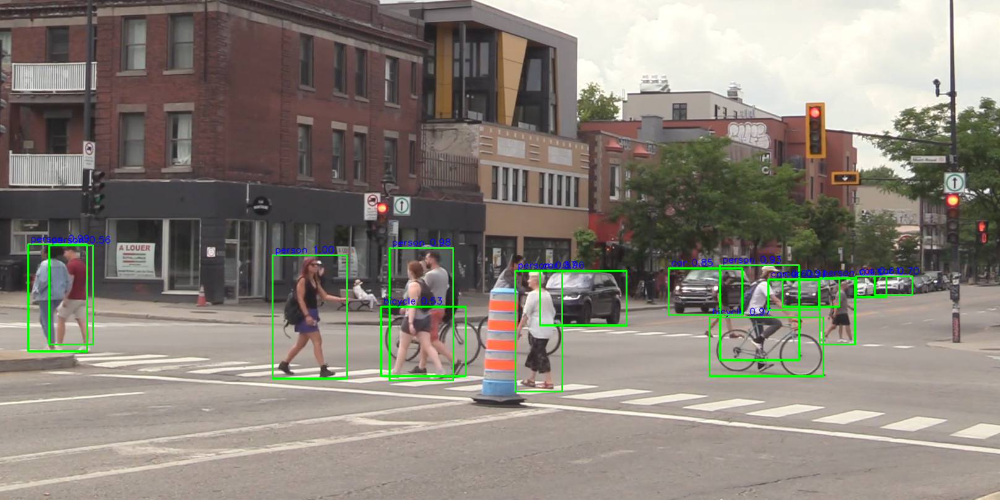

In [170]:
prediction = load_and_predict_image('images/img5.png')
cv2_imshow(prediction)

images/img2.jpg


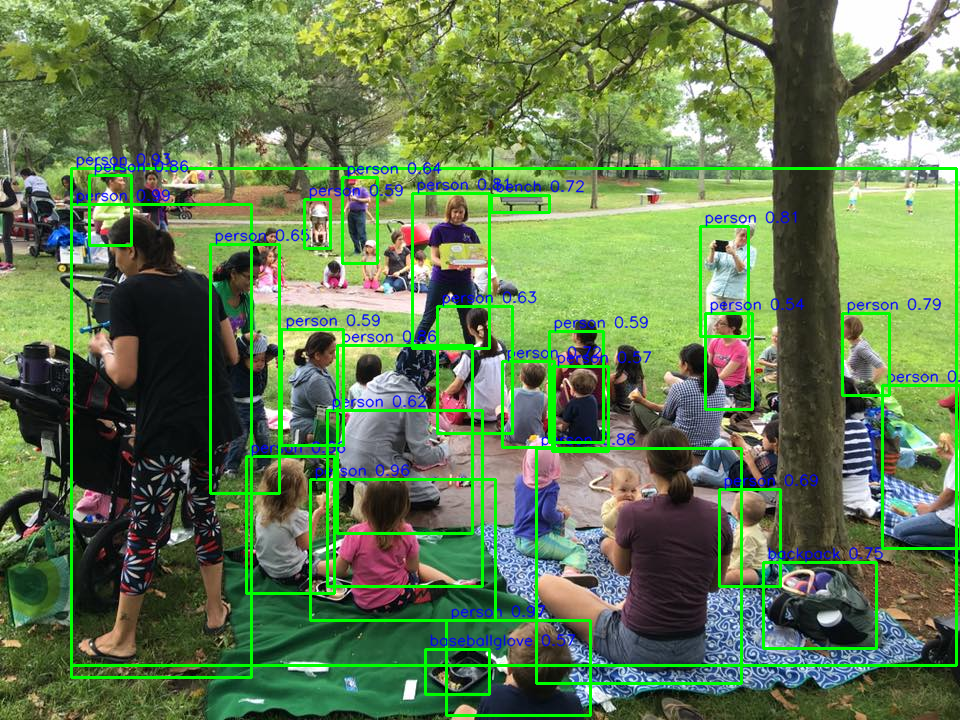

images/img4.jpg


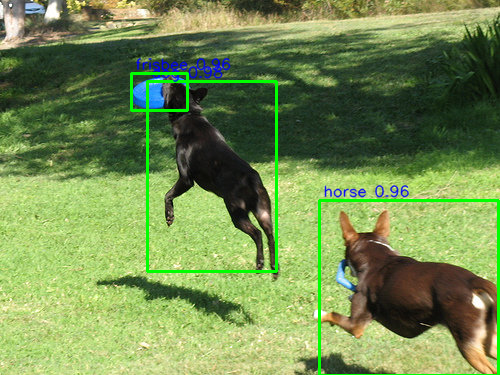

images/img3.jpg


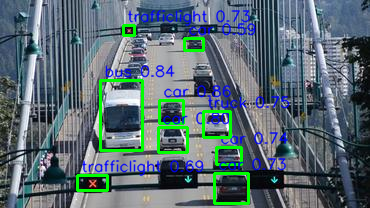

images/img6.png


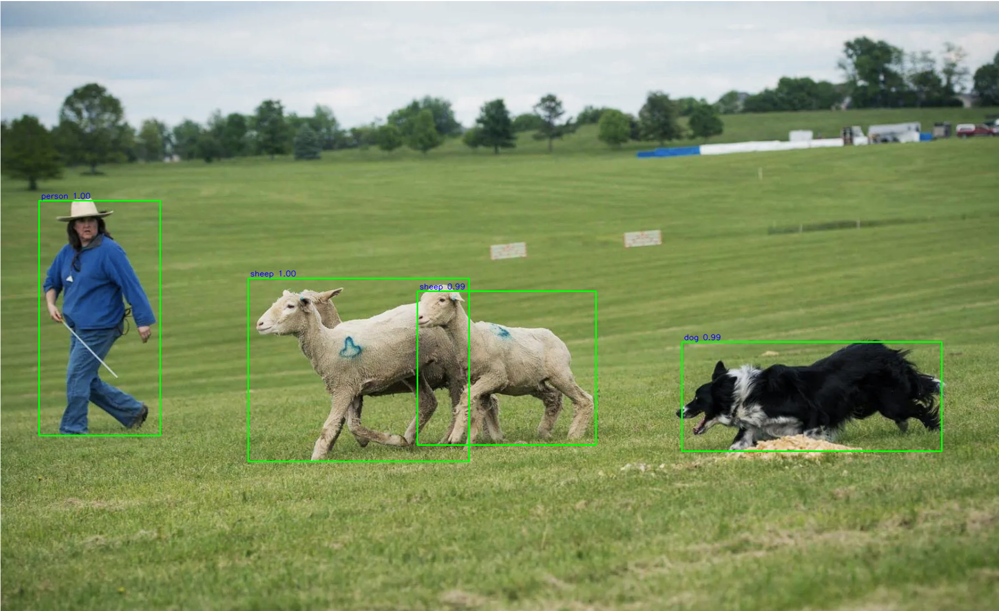

images/img5.png


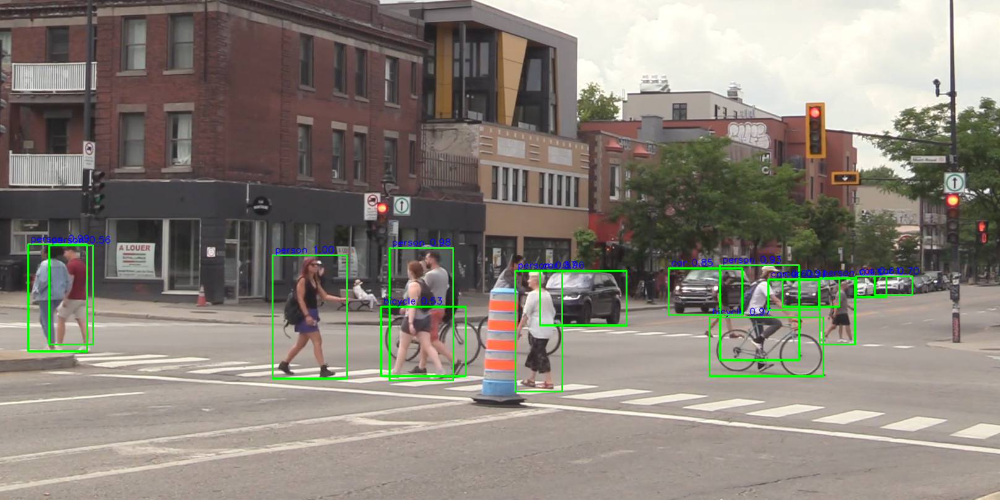

images/img1.jpg


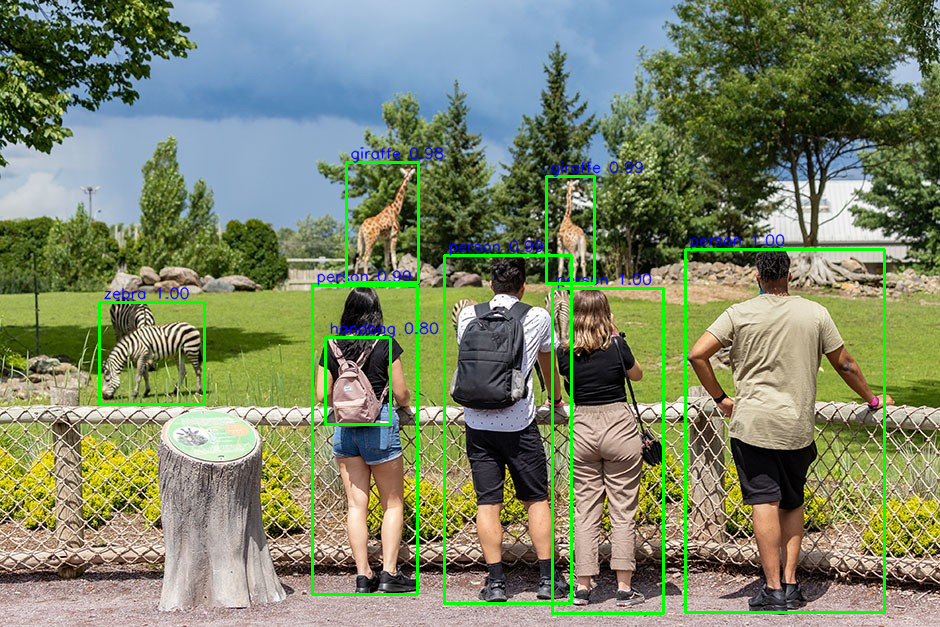

In [188]:
from google.colab.patches import cv2_imshow

import os

for root, dirs, files in os.walk("images"):
  for file in files:
    path = os.path.join(root, file)
    print(path)
    prediction = load_and_predict_image(path)
    cv2_imshow(prediction)